## Mobile Price Prediction
#### Features : 

##### battery_power : Total energy a battery can store in one time measured in mAh

##### blue : Has bluetooth or not
clock_speed : speed at which microprocessor executes instructions
dual _sim : Has dual sim support or not
fc : Front Camera megapixels
four_g : Has 4G or not
int_memory : Internal Memory in Gigabytes
m_dep : Mobile Depth in cm
mobile_wt : Weight of mobile phone
n_cores : Number of cores of processor
pc : Primary Camera megapixels
px_height : Pixel Resolution Height
px_width : Pixel Resolution Width
ram : Random Access Memory in Megabytes
sc_h : Screen Height of mobile in cm
sc_w : Screen Width of mobile in cm
talk_time : longest time that a single battery charge will last when you are
three_g : Has 3G or not
touch_screen : Has touch screen or not
wifi : Has wifi or not
price_range : This is the target variable with values of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

#### Importing necessary libraries

In [143]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#### Loading the Data

In [2]:
data = pd.read_csv("C:/Users/dell/Downloads/mobile_prices.csv")

In [3]:
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [5]:
data.shape

(2000, 21)

In [6]:
data.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [7]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [8]:
#checking null values
data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [9]:
#null value in percentage
data.isnull().sum()/data.shape[0]*100

battery_power    0.0
blue             0.0
clock_speed      0.0
dual_sim         0.0
fc               0.0
four_g           0.0
int_memory       0.0
m_dep            0.0
mobile_wt        0.0
n_cores          0.0
pc               0.0
px_height        0.0
px_width         0.0
ram              0.0
sc_h             0.0
sc_w             0.0
talk_time        0.0
three_g          0.0
touch_screen     0.0
wifi             0.0
price_range      0.0
dtype: float64

In [10]:
#unique elements in each attribute
data.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

## Plotting Histogram to check if the data is normally distributed(for numerical columns)

array([[<AxesSubplot:title={'center':'battery_power'}>,
        <AxesSubplot:title={'center':'blue'}>,
        <AxesSubplot:title={'center':'clock_speed'}>],
       [<AxesSubplot:title={'center':'dual_sim'}>,
        <AxesSubplot:title={'center':'fc'}>,
        <AxesSubplot:title={'center':'four_g'}>],
       [<AxesSubplot:title={'center':'int_memory'}>,
        <AxesSubplot:title={'center':'m_dep'}>,
        <AxesSubplot:title={'center':'mobile_wt'}>],
       [<AxesSubplot:title={'center':'n_cores'}>,
        <AxesSubplot:title={'center':'pc'}>,
        <AxesSubplot:title={'center':'px_height'}>],
       [<AxesSubplot:title={'center':'px_width'}>,
        <AxesSubplot:title={'center':'ram'}>,
        <AxesSubplot:title={'center':'sc_h'}>],
       [<AxesSubplot:title={'center':'sc_w'}>,
        <AxesSubplot:title={'center':'talk_time'}>,
        <AxesSubplot:title={'center':'three_g'}>],
       [<AxesSubplot:title={'center':'touch_screen'}>,
        <AxesSubplot:title={'center':'wifi'}

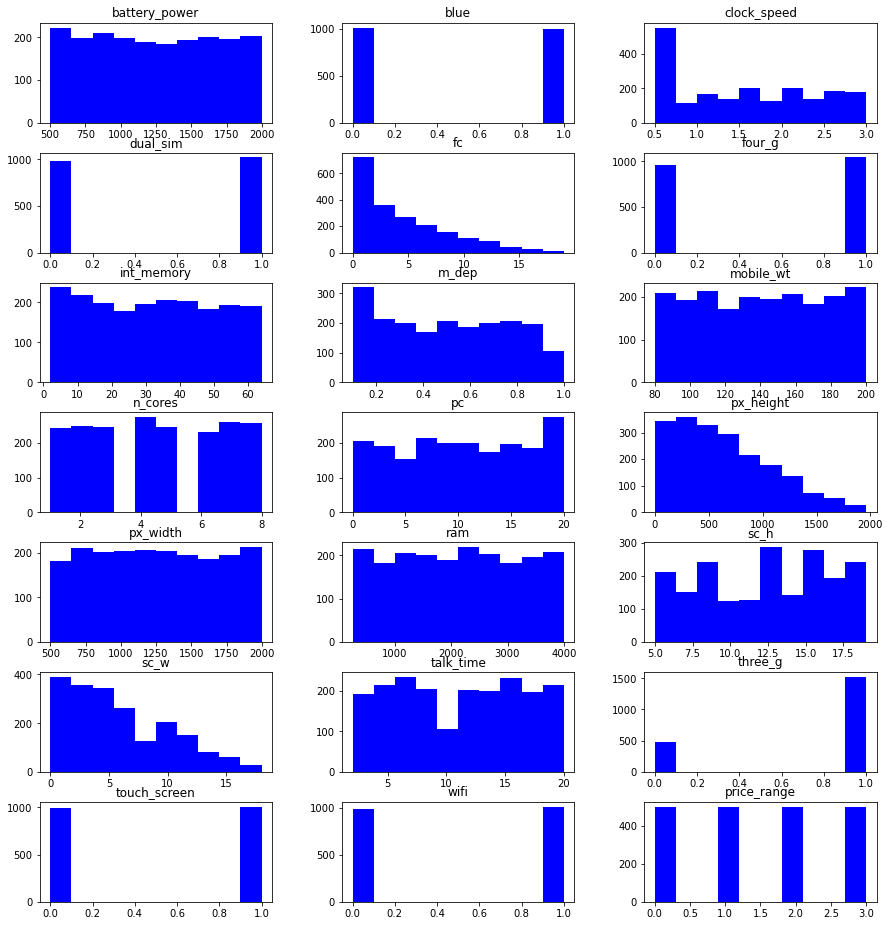

In [11]:
data.hist(layout=(22,3),color='blue',figsize=(15,52),grid=False)

In [12]:
# The data is not normally distributed

In [13]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

## Outlier Detection

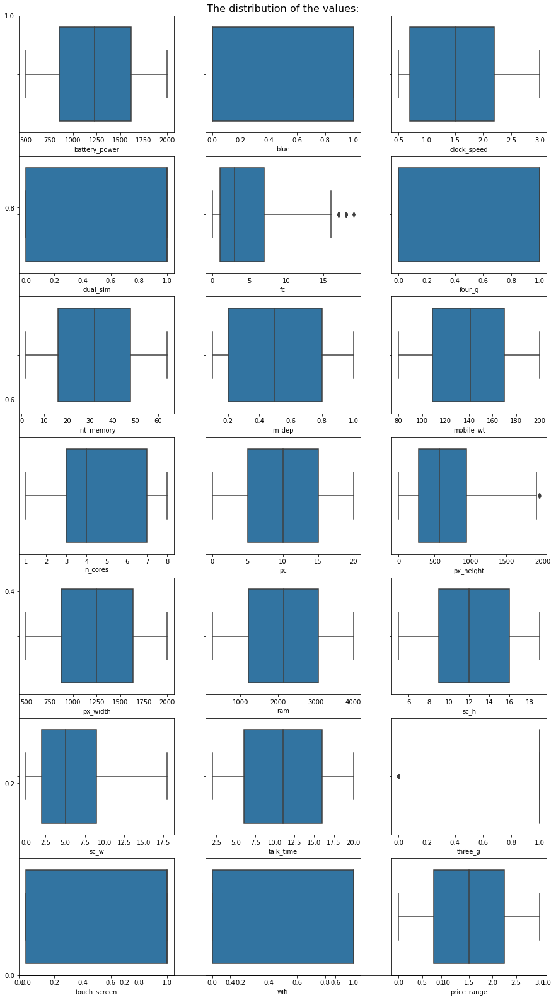

In [14]:
fig = plt.figure(figsize= (15, 28))
plt.title('The distribution of the values:', fontsize= 16)
axs = fig.subplots(nrows=7, ncols= 3)
sns.boxplot(data = data, x = 'battery_power', ax = axs[0,0])
sns.boxplot(data = data, x = 'blue',ax = axs[0,1])
sns.boxplot(data = data, x = 'clock_speed',ax = axs[0,2])
sns.boxplot(data = data, x = 'dual_sim', ax= axs[1,0])
sns.boxplot(data = data, x = 'fc', ax= axs[1,1])
sns.boxplot(data = data, x = 'four_g', ax= axs[1,2])
sns.boxplot(data = data, x = 'int_memory', ax= axs[2,0])
sns.boxplot(data = data, x = 'm_dep', ax= axs[2,1])
sns.boxplot(data = data, x = 'mobile_wt', ax= axs[2,2])
sns.boxplot(data = data, x = 'n_cores', ax= axs[3,0])
sns.boxplot(data = data, x = 'pc', ax= axs[3,1])
sns.boxplot(data = data, x = 'px_height', ax= axs[3,2])
sns.boxplot(data = data, x = 'px_width', ax= axs[4,0])
sns.boxplot(data = data, x = 'ram', ax= axs[4,1])
sns.boxplot(data = data, x = 'sc_h', ax= axs[4,2])
sns.boxplot(data = data, x = 'sc_w', ax= axs[5,0])
sns.boxplot(data = data, x = 'talk_time', ax= axs[5,1])
sns.boxplot(data = data, x = 'three_g', ax= axs[5,2])
sns.boxplot(data = data, x = 'touch_screen', ax= axs[6,0])
sns.boxplot(data = data, x = 'wifi', ax= axs[6,1])
sns.boxplot(data = data, x = 'price_range', ax= axs[6,2])
plt.show()

#### Looking at the above graphs we can see that there are outliers in the data

### Outlier Treatment/ Removing Outliers

In [15]:
def outliers(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_boundary = Q1 - 1.5 * IQR
    upper_boundary = Q3 + 1.5 * IQR
    df_new = dataframe.loc[(dataframe[column] > lower_boundary) & (dataframe[column] < upper_boundary)]
    return df_new

In [16]:
# the values distribution after excluding the outliers

fc = outliers(data, 'fc')
px_height = outliers(data, 'px_height')
sc_h = outliers(data, 'sc_h')

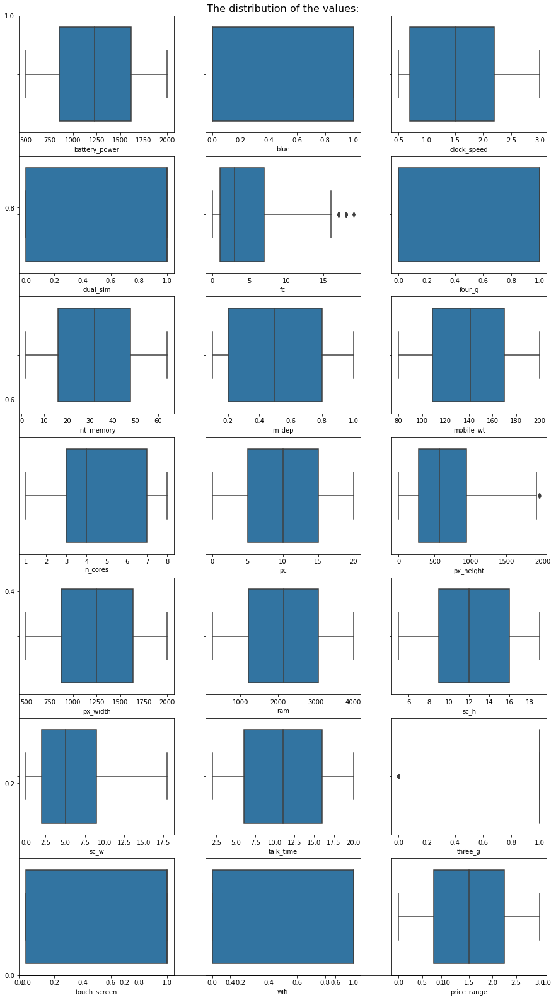

In [17]:
fig = plt.figure(figsize= (15, 28))
plt.title('The distribution of the values:', fontsize= 16)
axs = fig.subplots(nrows=7, ncols= 3)
sns.boxplot(data = data, x = 'battery_power', ax = axs[0,0])
sns.boxplot(data = data, x = 'blue',ax = axs[0,1])
sns.boxplot(data = data, x = 'clock_speed',ax = axs[0,2])
sns.boxplot(data = data, x = 'dual_sim', ax= axs[1,0])
sns.boxplot(data = data, x = 'fc', ax= axs[1,1])
sns.boxplot(data = data, x = 'four_g', ax= axs[1,2])
sns.boxplot(data = data, x = 'int_memory', ax= axs[2,0])
sns.boxplot(data = data, x = 'm_dep', ax= axs[2,1])
sns.boxplot(data = data, x = 'mobile_wt', ax= axs[2,2])
sns.boxplot(data = data, x = 'n_cores', ax= axs[3,0])
sns.boxplot(data = data, x = 'pc', ax= axs[3,1])
sns.boxplot(data = data, x = 'px_height', ax= axs[3,2])
sns.boxplot(data = data, x = 'px_width', ax= axs[4,0])
sns.boxplot(data = data, x = 'ram', ax= axs[4,1])
sns.boxplot(data = data, x = 'sc_h', ax= axs[4,2])
sns.boxplot(data = data, x = 'sc_w', ax= axs[5,0])
sns.boxplot(data = data, x = 'talk_time', ax= axs[5,1])
sns.boxplot(data = data, x = 'three_g', ax= axs[5,2])
sns.boxplot(data = data, x = 'touch_screen', ax= axs[6,0])
sns.boxplot(data = data, x = 'wifi', ax= axs[6,1])
sns.boxplot(data = data, x = 'price_range', ax= axs[6,2])
plt.show()

## Univariate Analysis

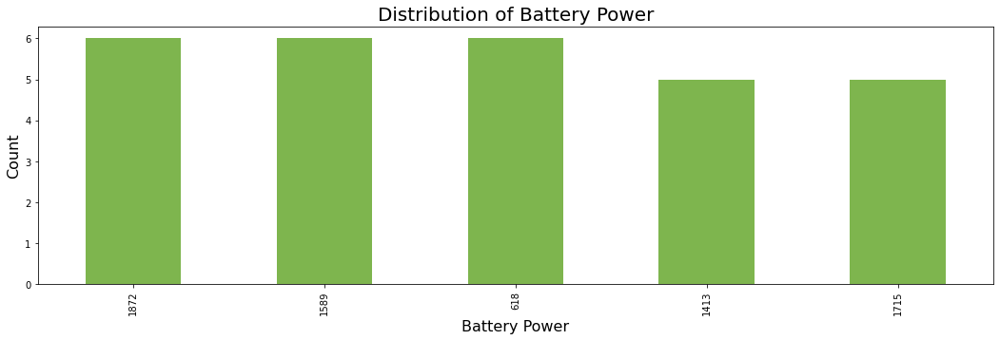

In [18]:
#Battery Power
plt.figure(figsize=(18,5))
data['battery_power'].value_counts()[:5].plot(kind='bar',color='#7eb54e')
plt.title("Distribution of Battery Power", fontsize = 20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Battery Power",fontsize=16)
plt.show()

In [19]:
data['battery_power'].value_counts()[:5]

1872    6
1589    6
618     6
1413    5
1715    5
Name: battery_power, dtype: int64

#### About 6 phones can store a battery power of 1872,1589 and 618 respectively which is amximum.

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


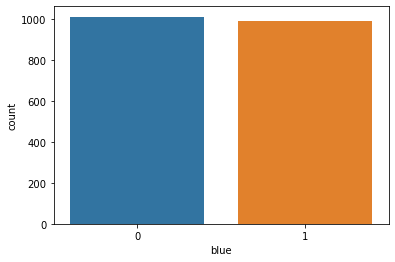

In [20]:
#Blue
sns.countplot(data['blue'])
plt.show()

In [21]:
data['blue'].value_counts(normalize=True)*100

0    50.5
1    49.5
Name: blue, dtype: float64

#### 

#### About 50% mobile phones have bluetooth option and about 49% do not have the bluetooth option.
#### Alternatively we can say that 50% of the cell phones have bluetooth option and 50% do not have the bluetooth option(since the percentages are very close)

In [22]:
#Clock speed
data['clock_speed'].value_counts(normalize=True)*100

0.5    20.65
2.8     4.25
2.3     3.90
2.1     3.80
1.6     3.80
2.5     3.70
0.6     3.70
1.4     3.50
1.3     3.40
2.0     3.35
1.5     3.35
1.9     3.25
0.7     3.20
2.9     3.10
1.8     3.10
1.0     3.05
1.7     3.00
2.2     2.95
2.4     2.90
0.8     2.90
0.9     2.90
1.2     2.80
2.6     2.75
2.7     2.75
1.1     2.55
3.0     1.40
Name: clock_speed, dtype: float64

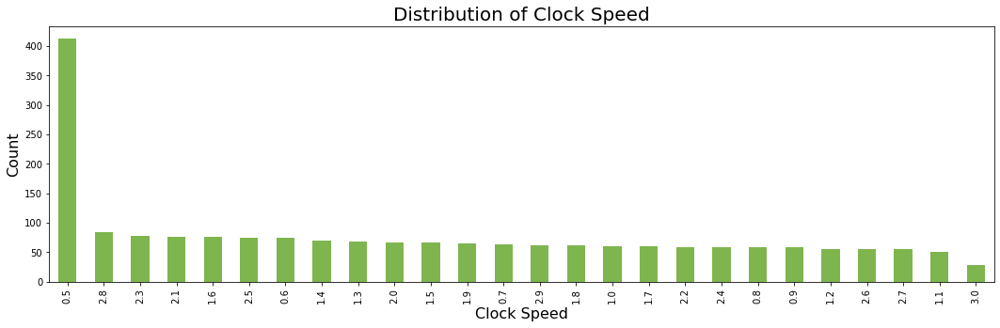

In [23]:
#Clock speed
plt.figure(figsize=(18,5))
data["clock_speed"].value_counts().plot(kind='bar',color='#7eb54e')
plt.title("Distribution of Clock Speed", fontsize = 20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Clock Speed",fontsize=16)
plt.show()


C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


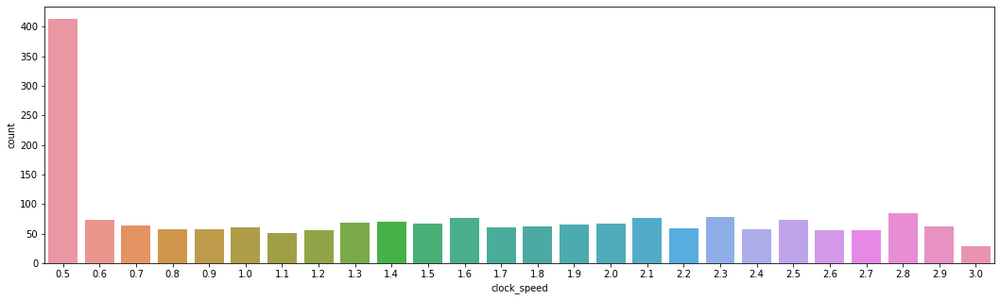

In [24]:
plt.figure(figsize=(18,5))
sns.countplot(data['clock_speed'])
plt.show()

#### About 20%(most of them) of the mobile phones have a clock speed of 0.5 .

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


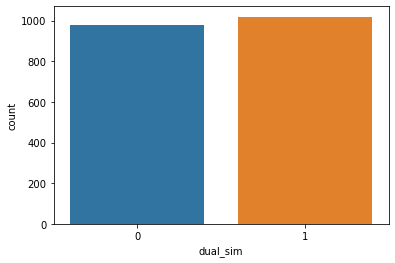

In [25]:
#dual sim
sns.countplot(data['dual_sim'])
plt.show()

In [26]:
data['dual_sim'].value_counts(normalize=True)*100

1    50.95
0    49.05
Name: dual_sim, dtype: float64

In [114]:
data['isDualSim'] = ' '
for i in range(len(data)):
    if data['dual_sim'][i] == 0:
        data['isDualSim'][i] = 'No'
    else:
        data['isDualSim'][i] = 'Yes'
px.pie(data_frame = data, names = 'isDualSim', title = 'Percentage of devices having Dual Sim', hole = 0.2)

<ipython-input-114-46ee75c62018>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['isDualSim'][i] = 'No'
<ipython-input-114-46ee75c62018>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['isDualSim'][i] = 'Yes'


#### About 50% of the mobile phones are dual sim while the other 50% are not dual sim mobile phones.

Text(0.5, 0, 'Count')

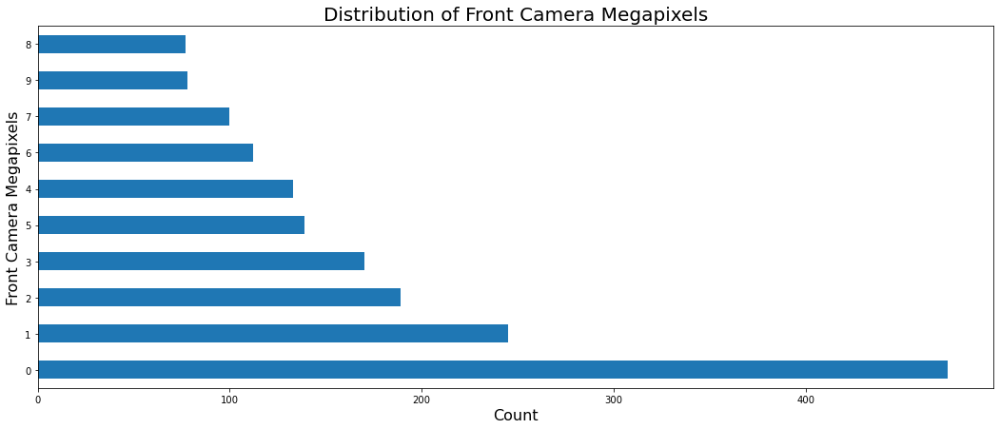

In [27]:
#Front Camera
plt.figure(figsize=(18,7))
data['fc'].value_counts()[:10].plot(kind='barh')
plt.title("Distribution of Front Camera Megapixels", fontsize = 20)
plt.ylabel("Front Camera Megapixels",fontsize = 16)
plt.xlabel("Count",fontsize = 16)

In [28]:
data['fc'].value_counts(normalize=True)*100

0     23.70
1     12.25
2      9.45
3      8.50
5      6.95
4      6.65
6      5.60
7      5.00
9      3.90
8      3.85
10     3.10
11     2.55
12     2.25
13     2.00
16     1.20
15     1.15
14     1.00
18     0.55
17     0.30
19     0.05
Name: fc, dtype: float64

#### About 23% of the mobile phones do not have a front camera, and about 12% of the mobile phones have a front camera with 1 megapixel.So. most of the phones have a frontcamera with 1 megapixel.

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


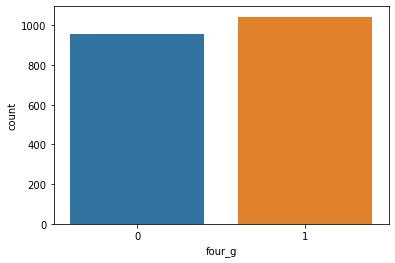

In [29]:
#four_g
sns.countplot(data['four_g'])
plt.show()

In [30]:
data['four_g'].value_counts(normalize=True)*100

1    52.15
0    47.85
Name: four_g, dtype: float64

#### About 52% of the mobile phones support 4G network and about 47% mobiles don't support 4G network

Text(0.5, 0, 'Internal Memory')

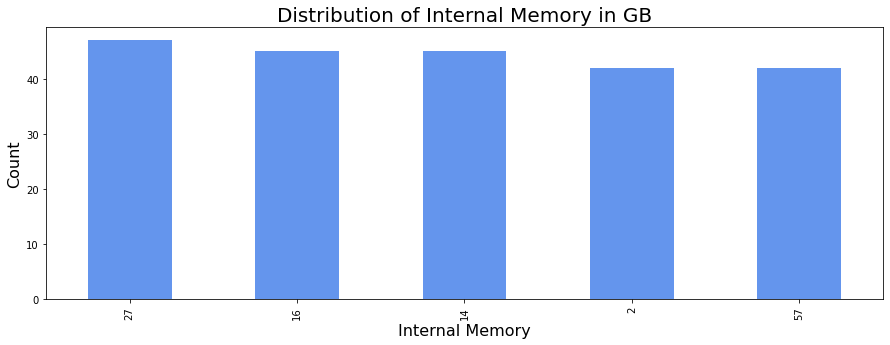

In [31]:
#Int_memory
plt.figure(figsize=(15,5))
data['int_memory'].value_counts()[:5].plot(kind='bar',color='cornflowerblue')
plt.title("Distribution of Internal Memory in GB",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Internal Memory",fontsize=16)

In [32]:
data['int_memory'].value_counts()[:10]

27    47
16    45
14    45
2     42
57    42
7     40
42    40
44    39
30    39
6     37
Name: int_memory, dtype: int64

In [33]:
data['int_memory'].value_counts(normalize=True)[:10]*100

27    2.35
16    2.25
14    2.25
2     2.10
57    2.10
7     2.00
42    2.00
44    1.95
30    1.95
6     1.85
Name: int_memory, dtype: float64

#### Max. number of mobile phones which is about 2.35% have 27 GB internal memory.

Text(0.5, 0, 'Count')

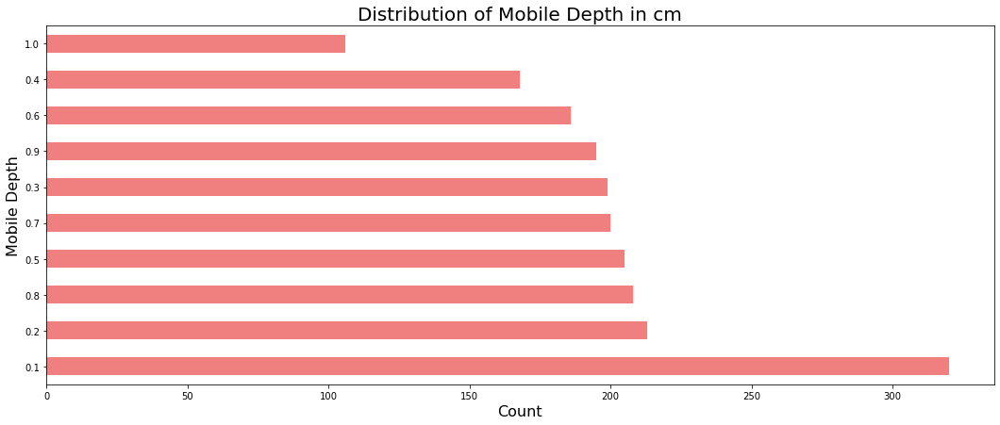

In [34]:
#m_dep
plt.figure(figsize=(18,7))
data['m_dep'].value_counts().plot(kind='barh',color='lightcoral')
plt.title("Distribution of Mobile Depth in cm", fontsize = 20)
plt.ylabel("Mobile Depth",fontsize = 16)
plt.xlabel("Count",fontsize = 16)

In [35]:
data['m_dep'].value_counts(normalize=True)*100

0.1    16.00
0.2    10.65
0.8    10.40
0.5    10.25
0.7    10.00
0.3     9.95
0.9     9.75
0.6     9.30
0.4     8.40
1.0     5.30
Name: m_dep, dtype: float64

#### Max number of mobile which is about 16% have a mobile depth of about 0.1 cm.

Text(0.5, 0, 'Count')

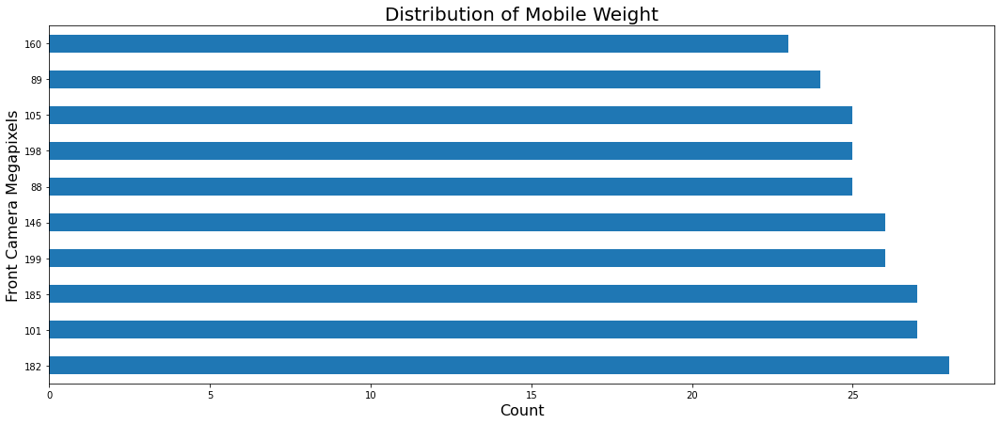

In [36]:
#mobile_wt
plt.figure(figsize=(18,7))
data['mobile_wt'].value_counts()[:10].plot(kind='barh')
plt.title("Distribution of Mobile Weight", fontsize = 20)
plt.ylabel("Front Camera Megapixels",fontsize = 16)
plt.xlabel("Count",fontsize = 16)

In [37]:
data['mobile_wt'].value_counts()[:10]

182    28
101    27
185    27
199    26
146    26
88     25
198    25
105    25
89     24
160    23
Name: mobile_wt, dtype: int64

In [38]:
data['mobile_wt'].value_counts(normalize=True)[:10]*100

182    1.40
101    1.35
185    1.35
199    1.30
146    1.30
88     1.25
198    1.25
105    1.25
89     1.20
160    1.15
Name: mobile_wt, dtype: float64

#### About 1.40% mobile phones have a weight of 182 grams(which is the highest)

Text(0.5, 0, 'Cores of Processor')

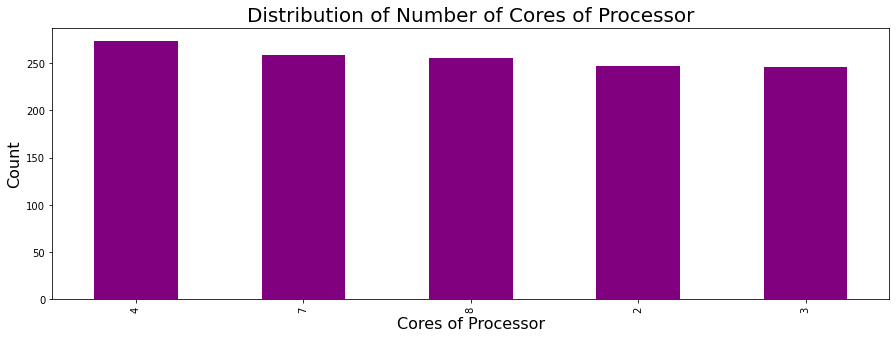

In [39]:
#n_cores
plt.figure(figsize=(15,5))
data['n_cores'].value_counts()[:5].plot(kind='bar',color='purple')
plt.title("Distribution of Number of Cores of Processor",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Cores of Processor",fontsize=16)

In [40]:
data['n_cores'].value_counts(normalize=True)*100

4    13.70
7    12.95
8    12.80
2    12.35
3    12.30
5    12.30
1    12.10
6    11.50
Name: n_cores, dtype: float64

#### About 13%(max. in this case) of the mobile phones have 4 cores of processor.

In [115]:
data['Cores'] = ' '
for i in range(len(data)):
    if data['n_cores'][i] == 1:
        data['Cores'][i] = 'Single-Core'
    elif data['n_cores'][i] == 2:
        data['Cores'][i] = 'Dual-Core'
    elif data['n_cores'][i] == 3:
        data['Cores'][i] = 'Triple-Core'
    elif data['n_cores'][i] == 4:
        data['Cores'][i] = 'Quad-Core'
    elif data['n_cores'][i] == 5:
        data['Cores'][i] = 'Penta-Core'
    elif data['n_cores'][i] == 6:
        data['Cores'][i] = 'Hexa-Core'
    elif data['n_cores'][i] == 7:
        data['Cores'][i] = 'Hepta-Core'
    else:
        data['Cores'][i] = 'Octa-Core'
px.pie(data_frame = data, names = 'Cores', title = 'Percentage of devices having Different types of Cores', hole = 0.2)

<ipython-input-115-66a1fe3f810a>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-115-66a1fe3f810a>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-115-66a1fe3f810a>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-115-66a1fe3f810a>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.or

Text(0.5, 0, 'Primary Camera Megapixels')

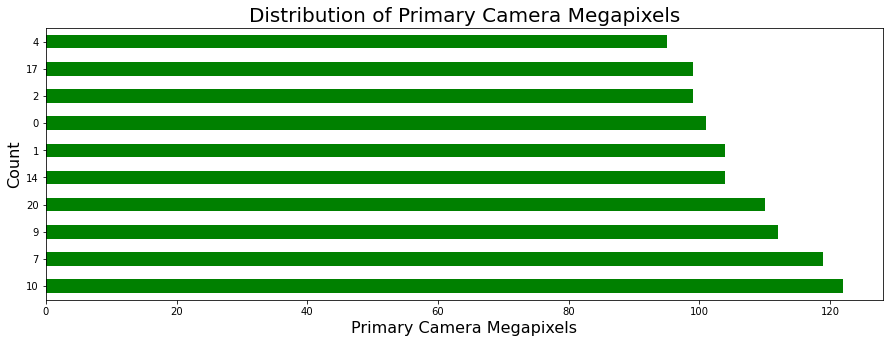

In [41]:
#pc
plt.figure(figsize=(15,5))
data['pc'].value_counts()[:10].plot(kind='barh',color='green')
plt.title("Distribution of Primary Camera Megapixels",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Primary Camera Megapixels",fontsize=16)

In [42]:
data['pc'].value_counts()[:10]

10    122
7     119
9     112
20    110
14    104
1     104
0     101
2      99
17     99
4      95
Name: pc, dtype: int64

In [43]:
data['pc'].value_counts(normalize=True)[:10]*100

10    6.10
7     5.95
9     5.60
20    5.50
14    5.20
1     5.20
0     5.05
2     4.95
17    4.95
4     4.75
Name: pc, dtype: float64

#### Max. mobile phones which is about 6.10% have a primary camera megapixel of 10

Text(0.5, 0, 'Pixel Resolution Height')

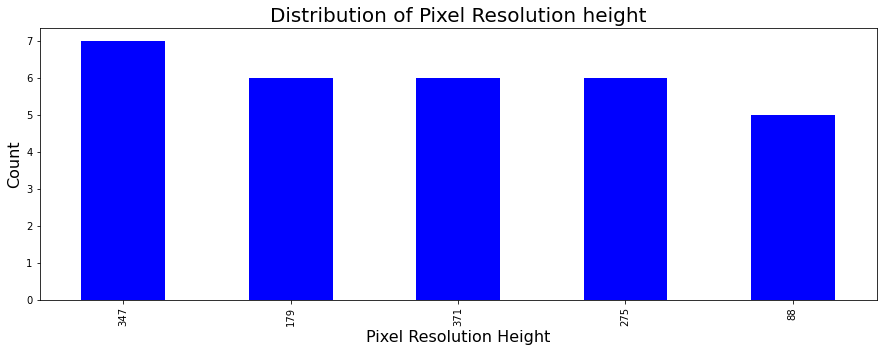

In [44]:
#px_height
plt.figure(figsize=(15,5))
data['px_height'].value_counts()[:5].plot(kind='bar',color='blue')
plt.title("Distribution of Pixel Resolution height",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Pixel Resolution Height",fontsize=16)

In [45]:
data['px_height'].value_counts()[:10]

347    7
179    6
371    6
275    6
88     5
674    5
398    5
447    5
730    5
42     5
Name: px_height, dtype: int64

In [46]:
data['px_height'].value_counts(normalize=True)[:10]*100

347    0.35
179    0.30
371    0.30
275    0.30
88     0.25
674    0.25
398    0.25
447    0.25
730    0.25
42     0.25
Name: px_height, dtype: float64

Text(0.5, 0, 'Pixel Resolution Width')

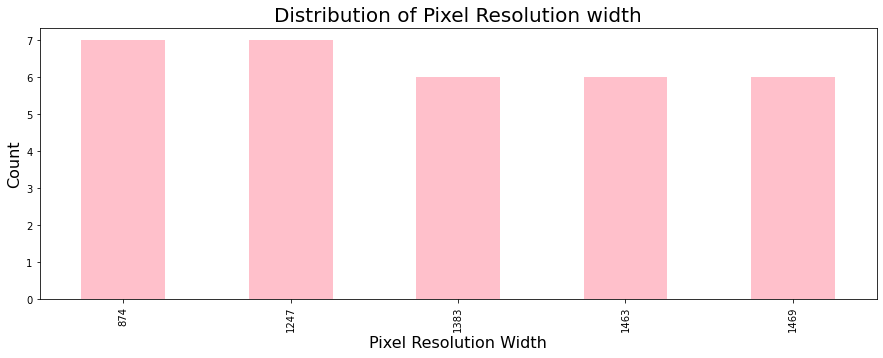

In [47]:
#px_width
plt.figure(figsize=(15,5))
data['px_width'].value_counts()[:5].plot(kind='bar',color='pink')
plt.title("Distribution of Pixel Resolution width",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Pixel Resolution Width",fontsize=16)

Text(0.5, 0, 'Ram in Megabytes')

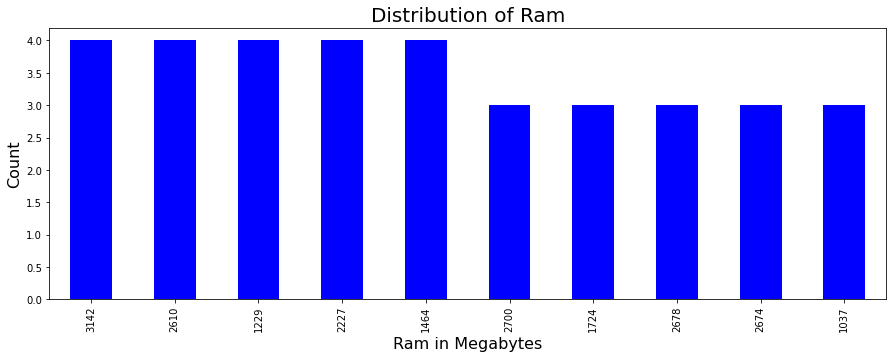

In [49]:
#ram
plt.figure(figsize=(15,5))
data['ram'].value_counts()[:10].plot(kind='bar',color='blue')
plt.title("Distribution of Ram",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Ram in Megabytes",fontsize=16)

In [50]:
data['ram'].value_counts()[:10]

3142    4
2610    4
1229    4
2227    4
1464    4
2700    3
1724    3
2678    3
2674    3
1037    3
Name: ram, dtype: int64

In [51]:
data['ram'].value_counts(normalize=True)[:10]*100

3142    0.20
2610    0.20
1229    0.20
2227    0.20
1464    0.20
2700    0.15
1724    0.15
2678    0.15
2674    0.15
1037    0.15
Name: ram, dtype: float64

#### Most common Ram in Megabytes are 3142,2610 ,1229,2227,1464 the frequency for all of them is 4(which is the maximum).

Text(0.5, 0, 'Distribution of Screen Height of mobile in cm')

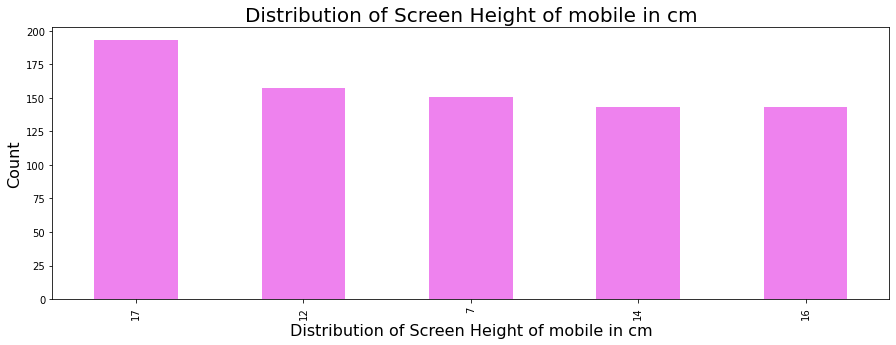

In [55]:
#sc_h
plt.figure(figsize=(15,5))
data['sc_h'].value_counts()[:5].plot(kind='bar',color='violet')
plt.title("Distribution of Screen Height of mobile in cm",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Distribution of Screen Height of mobile in cm",fontsize=16)

In [56]:
data['sc_h'].value_counts()[:10]

17    193
12    157
7     151
14    143
16    143
15    135
13    131
11    126
10    125
9     124
Name: sc_h, dtype: int64

In [57]:
data['sc_h'].value_counts(normalize=True)[:10]*100

17    9.65
12    7.85
7     7.55
14    7.15
16    7.15
15    6.75
13    6.55
11    6.30
10    6.25
9     6.20
Name: sc_h, dtype: float64

#### The most common screen height for a mobile phone is 17 cm.

Text(0.5, 0, 'Distribution of Screen width of mobile in cm')

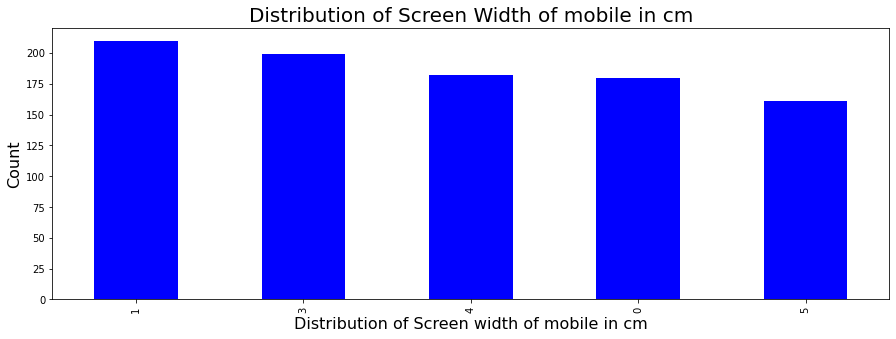

In [59]:
#sc_w
plt.figure(figsize=(15,5))
data['sc_w'].value_counts()[:5].plot(kind='bar',color='blue')
plt.title("Distribution of Screen Width of mobile in cm",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Distribution of Screen width of mobile in cm",fontsize=16)

In [60]:
data['sc_w'].value_counts()[:10]

1     210
3     199
4     182
0     180
5     161
2     156
7     132
6     130
8     125
10    107
Name: sc_w, dtype: int64

In [61]:
data['sc_w'].value_counts(normalize=True)[:10]*100

1     10.50
3      9.95
4      9.10
0      9.00
5      8.05
2      7.80
7      6.60
6      6.50
8      6.25
10     5.35
Name: sc_w, dtype: float64

#### Majority of the mobile phones i.e about 210 have a width of 1 cm

Text(0.5, 0, 'Distribution of Battery life')

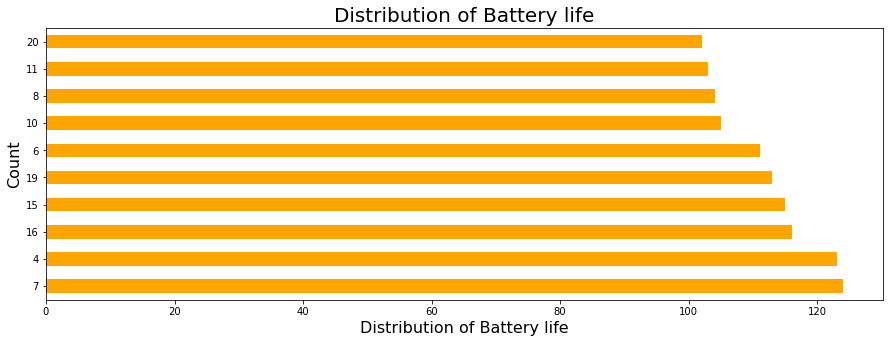

In [62]:
#talk_time
plt.figure(figsize=(15,5))
data['talk_time'].value_counts()[:10].plot(kind='barh',color='orange')
plt.title("Distribution of Battery life",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Distribution of Battery life",fontsize=16)

In [63]:
data['talk_time'].value_counts()[:10]

7     124
4     123
16    116
15    115
19    113
6     111
10    105
8     104
11    103
20    102
Name: talk_time, dtype: int64

In [64]:
data['talk_time'].value_counts(normalize=True)[:10]*100

7     6.20
4     6.15
16    5.80
15    5.75
19    5.65
6     5.55
10    5.25
8     5.20
11    5.15
20    5.10
Name: talk_time, dtype: float64

#### The longest time that a single battery charge will last for most of the mobile phones(for about 124) is 7 .

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


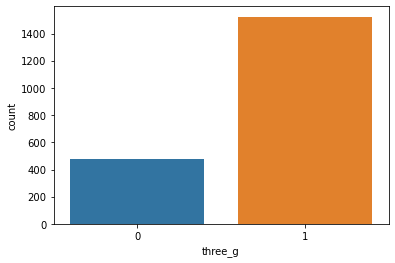

In [65]:
#three_g
sns.countplot(data['three_g'])
plt.show()

In [66]:
data['three_g'].value_counts(normalize=True)*100

1    76.15
0    23.85
Name: three_g, dtype: float64

#### About 76% of the phones have 3G service facility

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


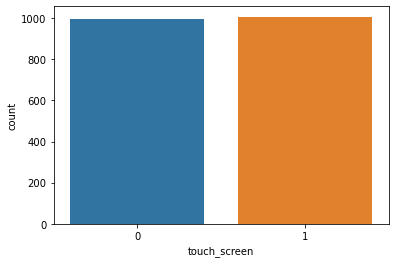

In [67]:
#touch_screen
sns.countplot(data['touch_screen'])
plt.show()

In [68]:
data['touch_screen'].value_counts(normalize=True)*100

1    50.3
0    49.7
Name: touch_screen, dtype: float64

#### About 51% of the phones have the touch screen feature

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


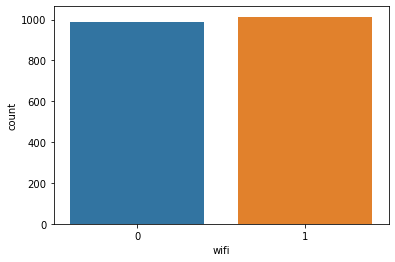

In [69]:
#wifi
sns.countplot(data['wifi'])
plt.show()

In [70]:
data['wifi'].value_counts(normalize=True)*100

1    50.7
0    49.3
Name: wifi, dtype: float64

#### About 50% phones have wifi

Text(0.5, 0, 'Distribution of Price Range')

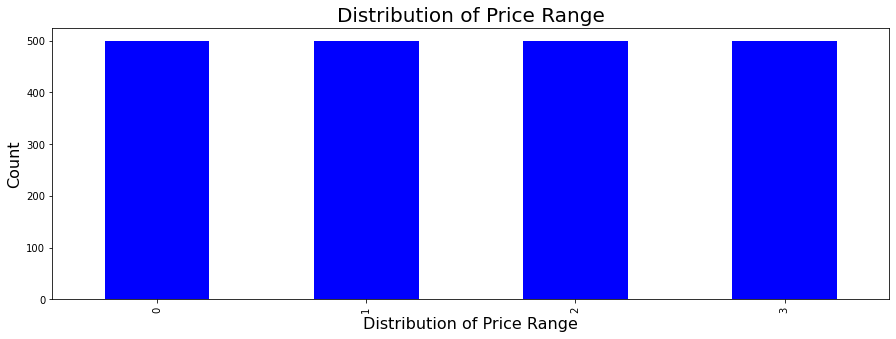

In [71]:
#price_range
plt.figure(figsize=(15,5))
data['price_range'].value_counts()[:5].plot(kind='bar',color='blue')
plt.title("Distribution of Price Range",fontsize=20)
plt.ylabel("Count",fontsize=16)
plt.xlabel("Distribution of Price Range",fontsize=16)

In [72]:
data['price_range'].value_counts()[:10]

0    500
1    500
2    500
3    500
Name: price_range, dtype: int64

In [73]:
data['price_range'].value_counts(normalize=True)*100

0    25.0
1    25.0
2    25.0
3    25.0
Name: price_range, dtype: float64

#### The distribution for low cost,medium cost,high cost and very high cost mobile phones is the same which is 25%.

#### Alternatively we can look at the univariate analysis at once using the below code:

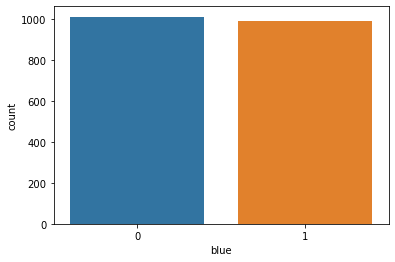

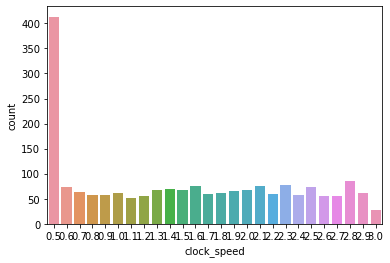

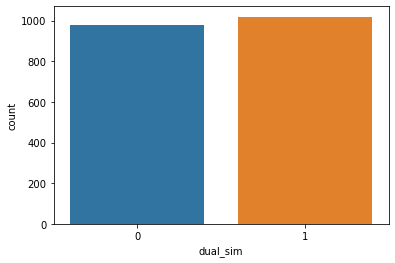

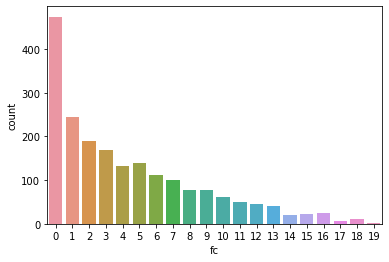

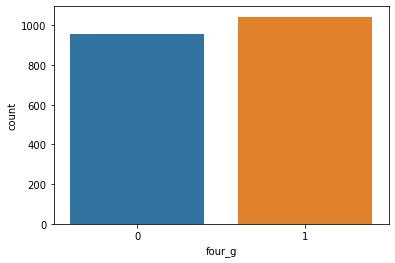

...

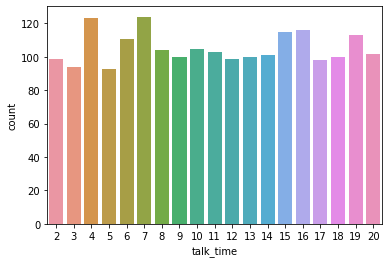

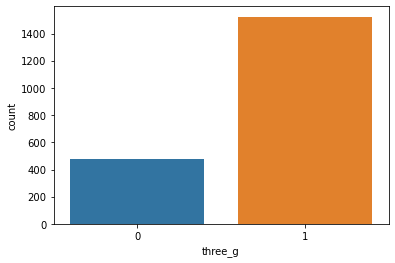

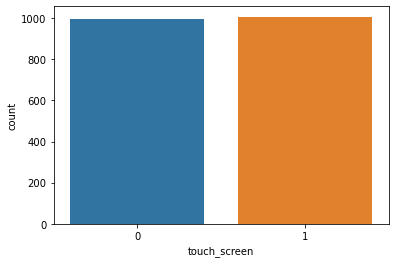

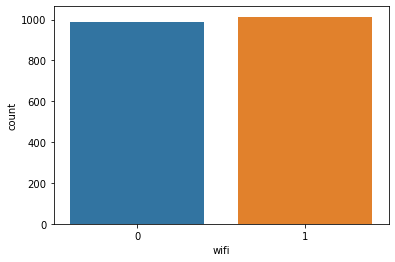

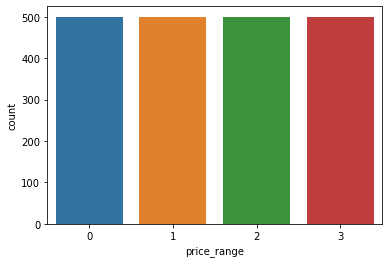

In [74]:
for i in data:
    if(data[i].nunique()<30):
        sns.countplot(x = data[i])
        plt.show()

##### Looking at the target variable closely

C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


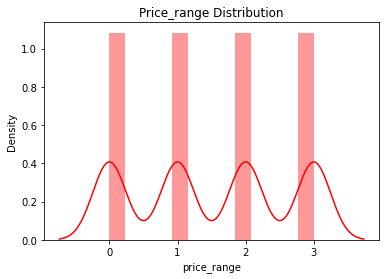

In [75]:
#checking the distribution for target variable 
sns.distplot(data["price_range"],color='r')
plt.title("Price_range Distribution")
plt.show()

#### The distribution is not normal.

In [76]:
data["price_range"].skew()

0.0

In [77]:
data["price_range"].kurtosis()

-1.360400119699068

In [78]:
data["price_range"].describe()

count    2000.000000
mean        1.500000
std         1.118314
min         0.000000
25%         0.750000
50%         1.500000
75%         2.250000
max         3.000000
Name: price_range, dtype: float64

In [79]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [95]:
group1=['battery_power','blue','clock_speed','dual_sim']

In [96]:
group2=['fc','four_g','int_memory','m_dep']

In [97]:
group3=['mobile_wt','n_cores','pc','px_height']

In [98]:
group4=['px_width','ram','sc_h','sc_w']

In [99]:
group5=['touch_screen','wifi','price_range','talk_time','three_g']

In [100]:
def UVA_KDE(data, var_group):
  size = len(var_group)
  plt.figure(figsize = (7*size,3), dpi = 100)
  for j,i in enumerate(var_group):
    mini = data[i].min()
    maxi = data[i].max()
    ran = data[i].max()-data[i].min()
    mean = data[i].mean()
    median = data[i].median()
    st_dev = data[i].std()
    skew = data[i].skew()
    kurt = data[i].kurtosis()
    points = mean-st_dev, mean+st_dev
    plt.subplot(1,size,j+1)
    sns.kdeplot(data[i], shade=True)
    sns.lineplot(points, [0,0], color = 'black', label = "std_dev")
    sns.scatterplot([mini,maxi], [0,0], color = 'orange', label = "min/max")
    sns.scatterplot([mean], [0], color = 'red', label = "mean")
    sns.scatterplot([median], [0], color = 'blue', label = "median")
    plt.xlabel('{}'.format(i), fontsize = 20)
    plt.ylabel('density')
    plt.title('kurtosis = {};\nskew = {}; range = {}\nmean = {}; median = {}'.format(round(kurt,2),round(skew,2),
                                                                                     round(ran,2),
                                                                                     round(mean,2),
                                                                                     round(median,2)))

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\l

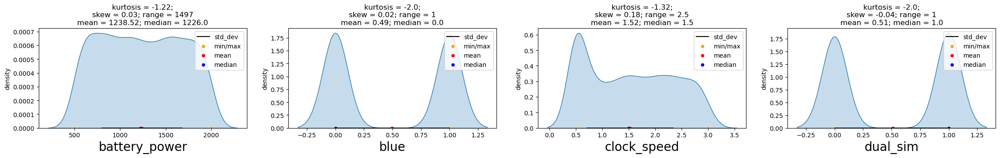

In [101]:
UVA_KDE(data,group1)

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\l

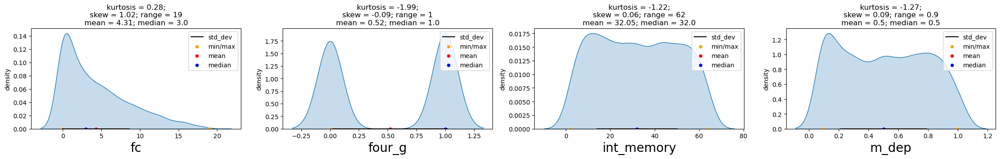

In [102]:
UVA_KDE(data,group2)

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\l

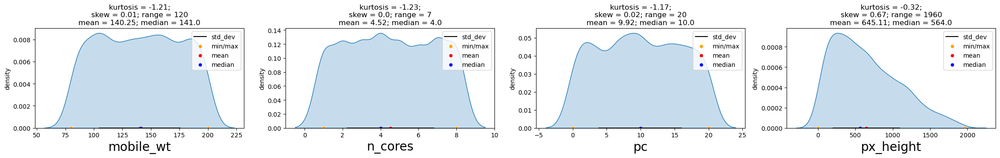

In [103]:
UVA_KDE(data,group3)

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\l

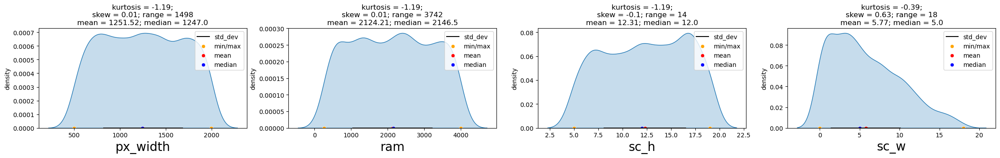

In [104]:
UVA_KDE(data,group4)

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dell\anaconda3\l

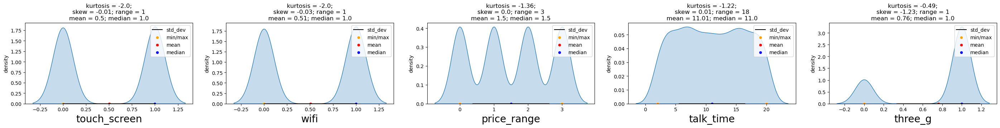

In [105]:
UVA_KDE(data,group5)

### INFERENCE -
#### By looking at the garphs we can say that the data is not normally distributed for these columns.

C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

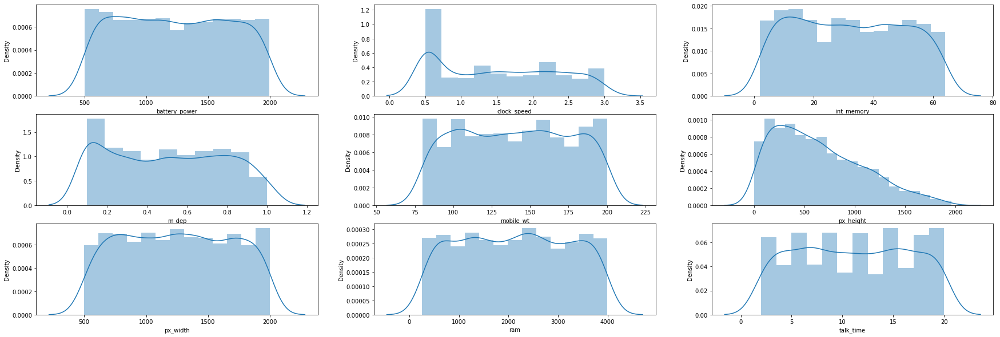

In [107]:
plt.figure(figsize = (30, 10))
plt.subplot(331)
sns.distplot(data['battery_power'])
plt.subplot(332)
sns.distplot(data['clock_speed'])
plt.subplot(333)
sns.distplot(data['int_memory'])
plt.subplot(334)
sns.distplot(data['m_dep'])
plt.subplot(335)
sns.distplot(data['mobile_wt'])
plt.subplot(336)
sns.distplot(data['px_height'])
plt.subplot(337)
sns.distplot(data['px_width'])
plt.subplot(338)
sns.distplot(data['ram'])
plt.subplot(339)
sns.distplot(data['talk_time'])
plt.show()

# Bivariate Analysis

In [119]:
var1=pd.crosstab(data['price_range'],data['blue'])

In [120]:
var1

blue,0,1
price_range,,
0,257,243
1,255,245
2,257,243
3,241,259


#### Majority of the phones belonging to the very high price category have bluetooth feature.

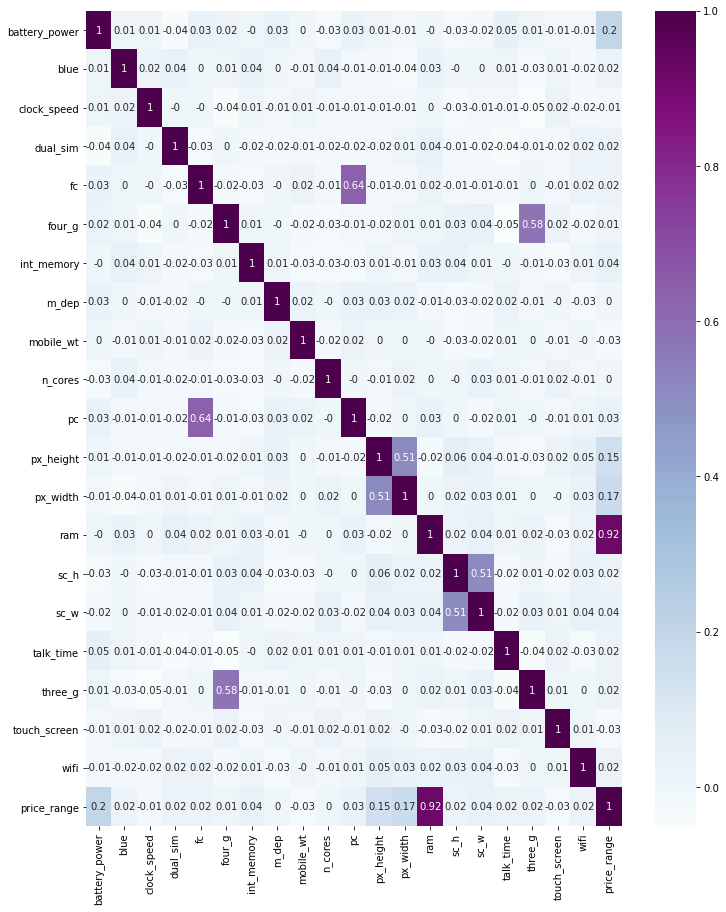

In [125]:
rounded = round(data.corr(method = 'pearson'),2)
plt.figure(figsize=(12,15))
ax = sns.heatmap(rounded, cmap='BuPu', annot=True)
plt.show()

##### From the graph we can see that there is a strong correlation between the variables price_range and ram of the mobile phones.
##### Ram has a huge impact on the mobile price

<Figure size 1080x720 with 0 Axes>

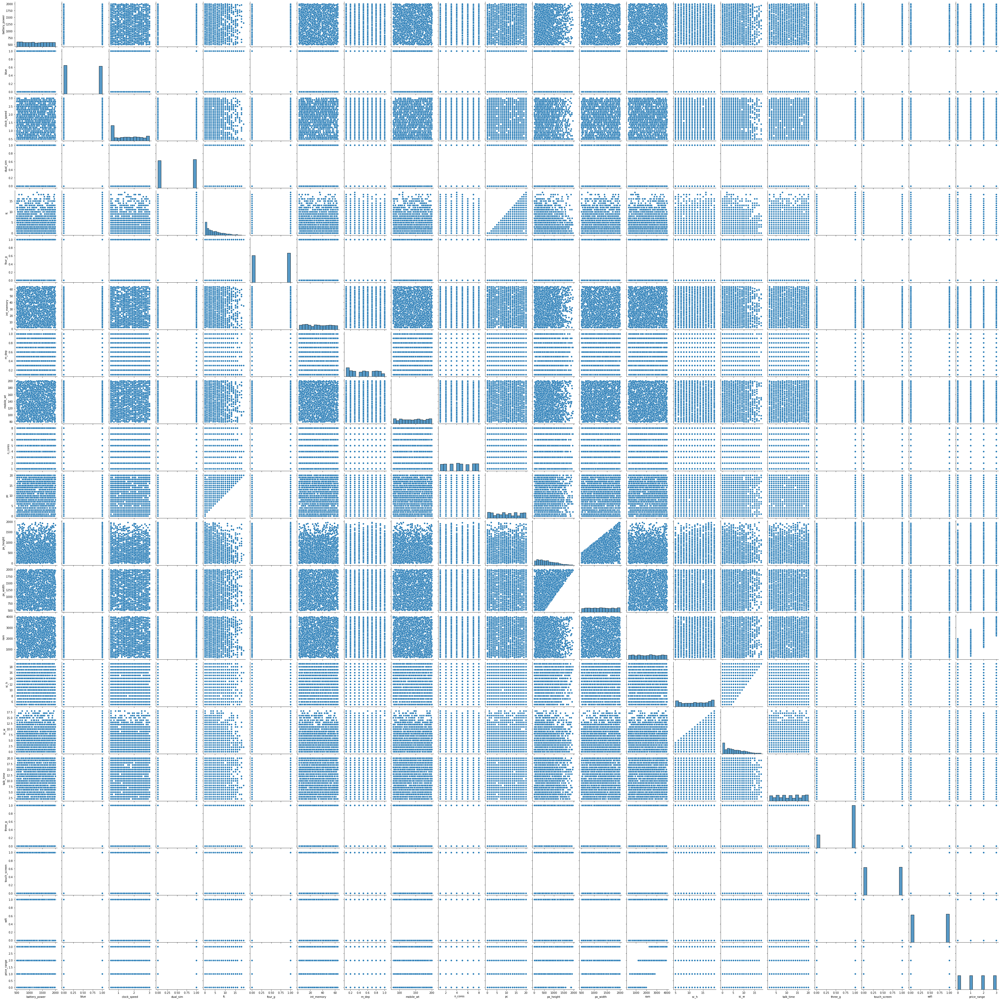

In [127]:
plt.figure(dpi=180)
sns.pairplot(data = data)

In [130]:
numerical = data.select_dtypes(exclude = ['category'])[:]
numerical.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
isDualSim         object
Cores             object
dtype: object

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='price_range', ylabel='ram'>

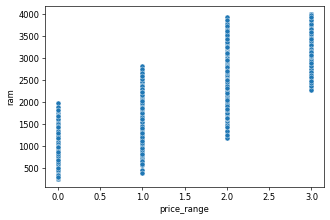

In [153]:
plt.figure(dpi=60)
sns.scatterplot(numerical['price_range'], numerical['ram'])

##### Expensive mobile phones have more Ram.

C:\Users\dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='price_range', ylabel='int_memory'>

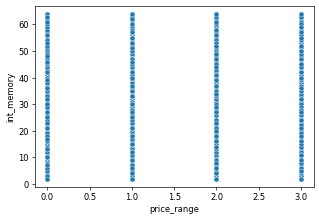

In [152]:
plt.figure(dpi=60)
sns.scatterplot(numerical['price_range'], numerical['int_memory'])

In [149]:
#px.histogram(data_frame = data, x = 'blue', color = 'price_range', title = 'Comparison of devices sold having Bluetooth or not')

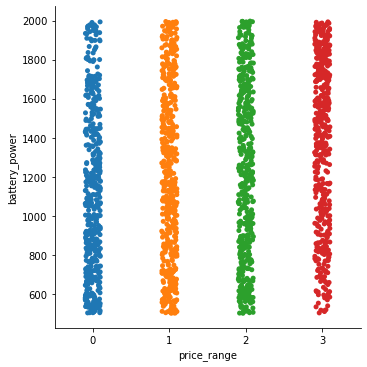

In [146]:
sns.catplot(x="price_range",y="battery_power",data=data)

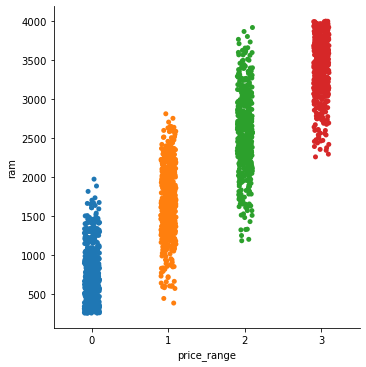

In [141]:
sns.catplot(x="price_range",y="ram",data=data)

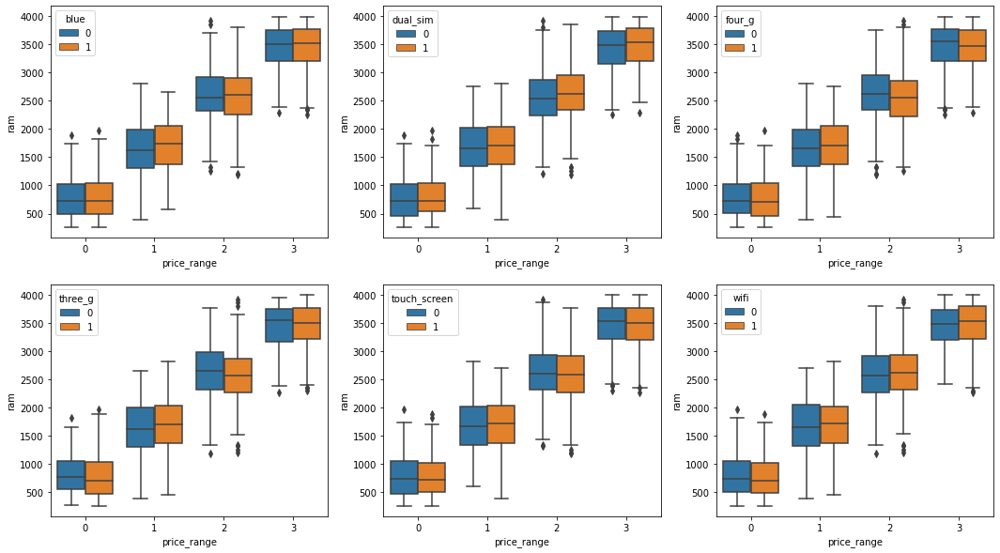

In [142]:
fig,axes=plt.subplots(2,3,figsize=(18,10))
cat=['blue','dual_sim','four_g','three_g','touch_screen','wifi']
k=0
for i in range(2):
    for j in range(3):
        sns.boxplot(ax=axes[i,j],x="price_range",y="ram",data=data,hue=cat[k])
        k+=1

In [148]:
#px.histogram(data_frame = data, x = 'Cores', color = 'price_range', title = 'Comparison of devices sold having Different Cores')

<AxesSubplot:xlabel='price_range', ylabel='ram'>

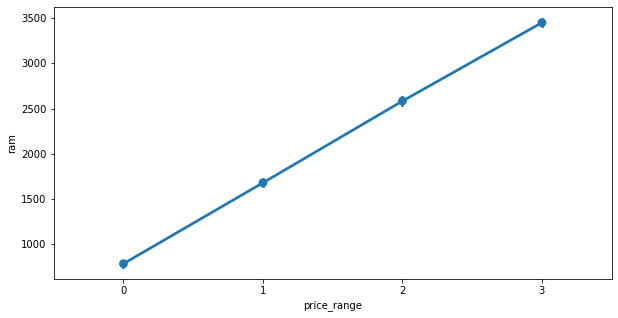

In [150]:
fig=plt.figure(figsize=(10,5))
sns.pointplot(y="ram", x="price_range", data=data)

#### There is a linear relationship between ram and the mobile price

<AxesSubplot:xlabel='price_range', ylabel='battery_power'>

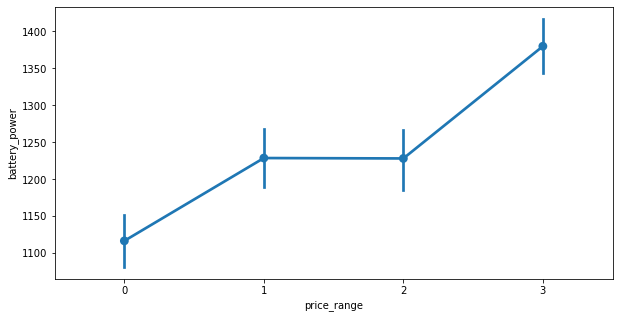

In [151]:
fig=plt.figure(figsize=(10,5))
sns.pointplot(y="battery_power", x="price_range", data=data)

#### Mobile phones belonging to the very high cost category have more/better battery life as
#### compared to mobile phones of lower price range

<AxesSubplot:xlabel='price_range', ylabel='mobile_wt'>

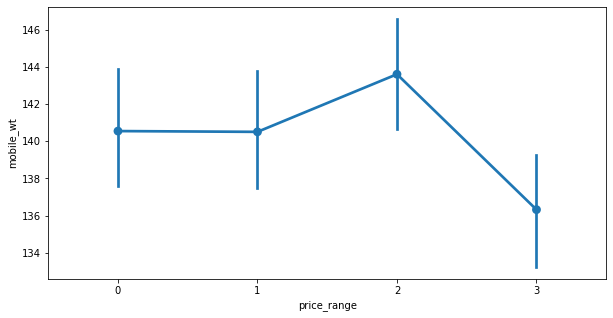

In [154]:
fig=plt.figure(figsize=(10,5))
sns.pointplot(y="mobile_wt", x="price_range", data=data)

#### Expensive moble phones are comparitively light weight 

<AxesSubplot:xlabel='price_range', ylabel='px_height'>

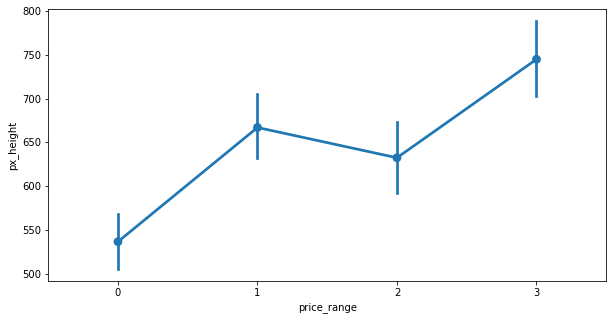

In [155]:
fig=plt.figure(figsize=(10,5))
sns.pointplot(y="px_height", x="price_range", data=data)

#### Expensive mobile phones have more pixel resolution height.

<AxesSubplot:xlabel='price_range', ylabel='px_width'>

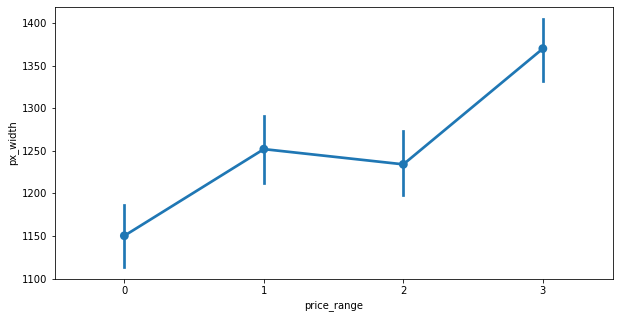

In [156]:
fig=plt.figure(figsize=(10,5))
sns.pointplot(y="px_width", x="price_range", data=data)

#### Expensive mobile phones have more pixel resolution height.

# Multivariate Analysis

####  visualize the 3 most highly correlated variables to price_range

In [159]:
import plotly.express as px
fig = px.scatter_3d(data.head(1000), x='ram', y='battery_power', z='px_width', color='price_range')
fig.show()

<AxesSubplot:xlabel='ram', ylabel='battery_power'>

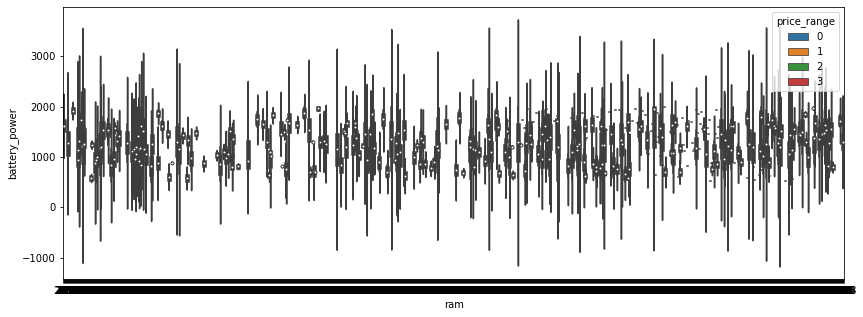

In [161]:
## Violinplot
plt.figure(figsize = (14, 5))
sns.violinplot(x="ram", 
               y="battery_power",
               hue="price_range",
               data=data)